In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import xgboost as xgb
from xgboost.callback import EarlyStopping

In [2]:
# Adjust settings to prevent wrapping or truncated displays
pd.set_option('display.max_colwidth', None)  # Ensures no truncation of column contents
pd.set_option('display.max_columns', None)  # Ensures all columns are shown
pd.set_option('display.max_rows', None)  # Ensures no truncation for rows
pd.set_option('display.expand_frame_repr', False)  # Prevents line wrapping for DataFrame

In [3]:
df = pd.read_csv('data/final_combined_dataset.csv')

In [4]:
df.head(5)

,date,year_week,cases,population,temp_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,city,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,cases_per_100k,nearby_cases_weighted
0,2012-01-01,201201,32,207044,19.000000,79.428571,55.514486,35.000000,25.048951,29.571429,angra dos reis,3300100,0.850500,0.852633,5.6804,18.3375,5.2038,18.7979,-44.319627,-23.009116,15.455652,6.913995
1,2012-01-08,201202,40,207044,19.714286,82.285714,62.357393,47.428571,23.737513,26.571429,angra dos reis,3300100,0.852050,0.852633,4.0716,16.5375,3.9114,16.8583,-44.319627,-23.009116,19.319565,32.825012
2,2012-01-15,201203,19,207044,20.000000,83.000000,65.236264,45.571429,24.413187,28.714286,angra dos reis,3300100,0.853541,0.852633,2.0555,5.0500,1.7556,3.1368,-44.319627,-23.009116,9.176793,14.685214
3,2012-01-22,201204,33,207044,19.285714,83.000000,60.362637,43.428571,24.879121,28.857143,angra dos reis,3300100,0.854877,0.852633,1.5416,5.7059,1.4138,5.2767,-44.319627,-23.009116,15.938641,2.809255
4,2012-01-29,201205,36,207044,18.857143,80.857143,50.885924,33.142857,25.989992,30.428571,angra dos reis,3300100,0.856021,0.852633,2.8204,9.3826,2.0057,7.8749,-44.319627,-23.009116,17.387608,19.938997


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52234 entries, 0 to 52233
Data columns (total 22 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   date                                  52234 non-null  object 
 1   year_week                             52234 non-null  int64  
 2   cases                                 52234 non-null  int64  
 3   population                            52234 non-null  int64  
 4   temp_min                              52234 non-null  float64
 5   humidity_max                          52234 non-null  float64
 6   humidity_avg                          52234 non-null  float64
 7   humidity_min                          52234 non-null  float64
 8   temp_avg                              52234 non-null  float64
 9   temp_max                              52234 non-null  float64
 10  city                                  52234 non-null  object 
 11  geocode        

In [6]:
# Shift the cases column to create the 2-weeks-ahead target
df['cases_2w_ahead'] = df.groupby('geocode')['cases'].shift(-2)

# Drop the last 2 rows for each municipality (since they won't have a future target)
df = df.dropna(subset=['cases_2w_ahead']).reset_index(drop=True)

In [7]:
df.head(10)

,date,year_week,cases,population,temp_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,city,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,cases_per_100k,nearby_cases_weighted,cases_2w_ahead
0,2012-01-01,201201,32,207044,19.000000,79.428571,55.514486,35.000000,25.048951,29.571429,angra dos reis,3300100,0.850500,0.852633,5.6804,18.3375,5.2038,18.7979,-44.319627,-23.009116,15.455652,6.913995,19.0
1,2012-01-08,201202,40,207044,19.714286,82.285714,62.357393,47.428571,23.737513,26.571429,angra dos reis,3300100,0.852050,0.852633,4.0716,16.5375,3.9114,16.8583,-44.319627,-23.009116,19.319565,32.825012,33.0
2,2012-01-15,201203,19,207044,20.000000,83.000000,65.236264,45.571429,24.413187,28.714286,angra dos reis,3300100,0.853541,0.852633,2.0555,5.0500,1.7556,3.1368,-44.319627,-23.009116,9.176793,14.685214,36.0
3,2012-01-22,201204,33,207044,19.285714,83.000000,60.362637,43.428571,24.879121,28.857143,angra dos reis,3300100,0.854877,0.852633,1.5416,5.7059,1.4138,5.2767,-44.319627,-23.009116,15.938641,2.809255,39.0
4,2012-01-29,201205,36,207044,18.857143,80.857143,50.885924,33.142857,25.989992,30.428571,angra dos reis,3300100,0.856021,0.852633,2.8204,9.3826,2.0057,7.8749,-44.319627,-23.009116,17.387608,19.938997,37.0
5,2012-02-05,201206,39,207044,19.571429,81.571429,43.494048,22.142857,28.614927,33.571429,angra dos reis,3300100,0.857159,0.858000,3.8170,25.9830,3.8228,26.0478,-44.319627,-23.009116,18.836576,8.766989,33.0
6,2012-02-12,201207,37,207044,20.142857,80.142857,56.778911,40.571429,25.791314,29.571429,angra dos reis,3300100,0.858241,0.858000,4.0861,29.4086,4.0920,29.0110,-44.319627,-23.009116,17.870598,12.823065,46.0
7,2012-02-19,201208,33,207044,21.857143,74.000000,51.458425,34.428571,27.253296,31.285714,angra dos reis,3300100,0.859142,0.858000,0.5962,4.0133,0.4783,3.2643,-44.319627,-23.009116,15.938641,12.077424,42.0
8,2012-02-26,201209,46,207044,20.714286,80.142857,43.760989,21.285714,28.902930,34.000000,angra dos reis,3300100,0.860082,0.858000,0.8143,3.8456,0.8171,3.8703,-44.319627,-23.009116,22.217500,6.661086,38.0
9,2012-03-04,201210,42,207044,20.428571,71.714286,48.333639,28.428571,26.467491,30.857143,angra dos reis,3300100,0.860933,0.861567,1.1867,5.3867,0.6647,3.8741,-44.319627,-23.009116,20.285543,3.513488,52.0


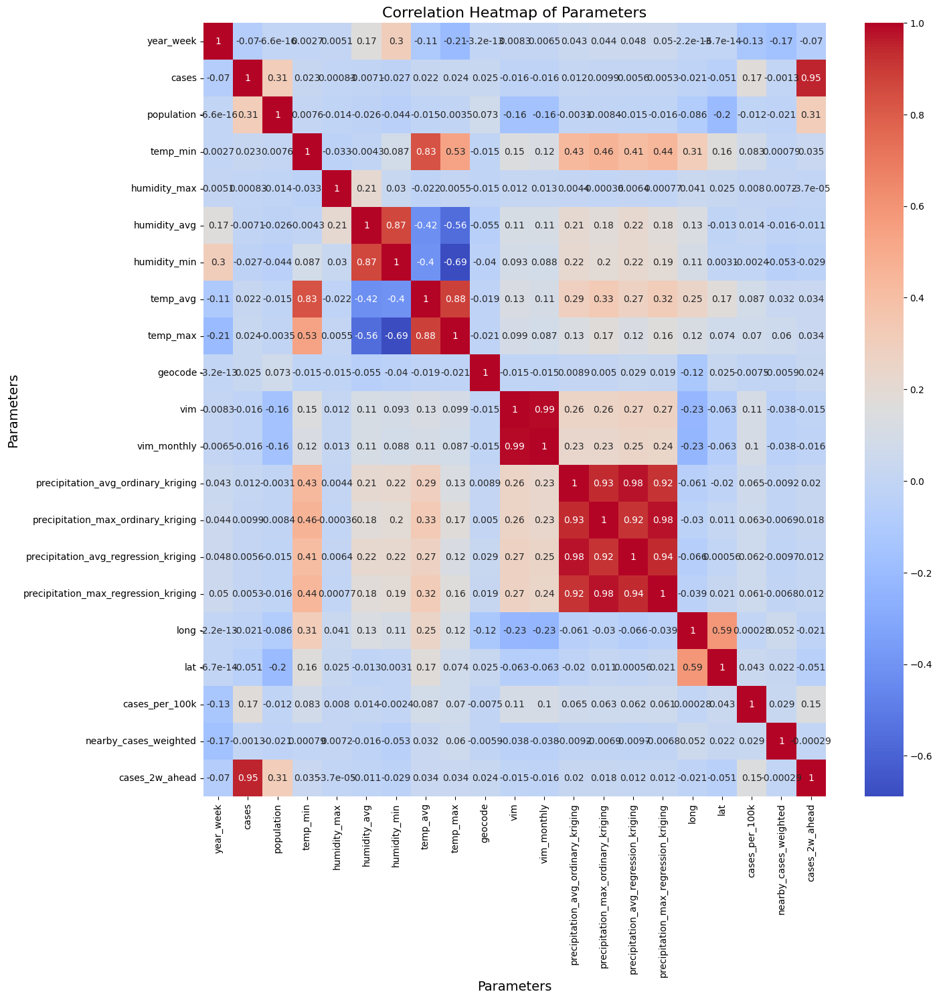

In [8]:
# Calculate the correlation matrix
s = df.select_dtypes(include="number").corr()

# Create the heatmap
plt.figure(figsize=(15, 15))
heatmap = sns.heatmap(s, annot=True, cmap="coolwarm")

plt.xlabel("Parameters", fontsize=14)
plt.ylabel("Parameters", fontsize=14)
plt.title("Correlation Heatmap of Parameters", fontsize=16)

plt.show()

In [9]:
# Ensure 'week' is numeric to allow mathematical operations; invalid values become NaN
df['year_week'] = pd.to_numeric(df['year_week'], errors='coerce')

# Convert 'date' to datetime format for easier manipulation and analysis
df['date'] = pd.to_datetime(df['date'])

In [10]:
# Add ordinal date
df['date_ordinal'] = df['date'].apply(lambda x: x.toordinal())

# Extract year/month features
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month

# Extract the week number (last two digits of 'year_week')
df['week'] = df['year_week'] % 100

# Add cyclic representations for month and week
df['month_sin'] = np.sin(2 * np.pi * df['month'] / 12)
df['month_cos'] = np.cos(2 * np.pi * df['month'] / 12)
df['week_sin'] = np.sin(2 * np.pi * df['week'] / 52)
df['week_cos'] = np.cos(2 * np.pi * df['week'] / 52)

In [11]:
df.head(5)

,date,year_week,cases,population,temp_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,city,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,cases_per_100k,nearby_cases_weighted,cases_2w_ahead,date_ordinal,year,month,week,month_sin,month_cos,week_sin,week_cos
0,2012-01-01,201201,32,207044,19.000000,79.428571,55.514486,35.000000,25.048951,29.571429,angra dos reis,3300100,0.850500,0.852633,5.6804,18.3375,5.2038,18.7979,-44.319627,-23.009116,15.455652,6.913995,19.0,734503,2012,1,1,0.5,0.866025,0.120537,0.992709
1,2012-01-08,201202,40,207044,19.714286,82.285714,62.357393,47.428571,23.737513,26.571429,angra dos reis,3300100,0.852050,0.852633,4.0716,16.5375,3.9114,16.8583,-44.319627,-23.009116,19.319565,32.825012,33.0,734510,2012,1,2,0.5,0.866025,0.239316,0.970942
2,2012-01-15,201203,19,207044,20.000000,83.000000,65.236264,45.571429,24.413187,28.714286,angra dos reis,3300100,0.853541,0.852633,2.0555,5.0500,1.7556,3.1368,-44.319627,-23.009116,9.176793,14.685214,36.0,734517,2012,1,3,0.5,0.866025,0.354605,0.935016
3,2012-01-22,201204,33,207044,19.285714,83.000000,60.362637,43.428571,24.879121,28.857143,angra dos reis,3300100,0.854877,0.852633,1.5416,5.7059,1.4138,5.2767,-44.319627,-23.009116,15.938641,2.809255,39.0,734524,2012,1,4,0.5,0.866025,0.464723,0.885456
4,2012-01-29,201205,36,207044,18.857143,80.857143,50.885924,33.142857,25.989992,30.428571,angra dos reis,3300100,0.856021,0.852633,2.8204,9.3826,2.0057,7.8749,-44.319627,-23.009116,17.387608,19.938997,37.0,734531,2012,1,5,0.5,0.866025,0.568065,0.822984


In [12]:
df = df.drop(columns=['date', 'year_week', 'week', 'month'])

In [13]:
# Add lag features to capture the relationship between current and past cases
df['cases_lag1'] = df['cases'].shift(1)  # Previous time step
df['cases_lag2'] = df['cases'].shift(2)  # Two time steps prior
df['cases_lag3'] = df['cases'].shift(3)  # Three time steps prior
df['cases_lag4'] = df['cases'].shift(4)  # Four time steps prior

In [14]:
df.head(10)

,cases,population,temp_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,city,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,cases_per_100k,nearby_cases_weighted,cases_2w_ahead,date_ordinal,year,month_sin,month_cos,week_sin,week_cos,cases_lag1,cases_lag2,cases_lag3,cases_lag4
0,32,207044,19.000000,79.428571,55.514486,35.000000,25.048951,29.571429,angra dos reis,3300100,0.850500,0.852633,5.6804,18.3375,5.2038,18.7979,-44.319627,-23.009116,15.455652,6.913995,19.0,734503,2012,0.500000,8.660254e-01,0.120537,0.992709,NaN,NaN,NaN,NaN
1,40,207044,19.714286,82.285714,62.357393,47.428571,23.737513,26.571429,angra dos reis,3300100,0.852050,0.852633,4.0716,16.5375,3.9114,16.8583,-44.319627,-23.009116,19.319565,32.825012,33.0,734510,2012,0.500000,8.660254e-01,0.239316,0.970942,32.0,NaN,NaN,NaN
2,19,207044,20.000000,83.000000,65.236264,45.571429,24.413187,28.714286,angra dos reis,3300100,0.853541,0.852633,2.0555,5.0500,1.7556,3.1368,-44.319627,-23.009116,9.176793,14.685214,36.0,734517,2012,0.500000,8.660254e-01,0.354605,0.935016,40.0,32.0,NaN,NaN
3,33,207044,19.285714,83.000000,60.362637,43.428571,24.879121,28.857143,angra dos reis,3300100,0.854877,0.852633,1.5416,5.7059,1.4138,5.2767,-44.319627,-23.009116,15.938641,2.809255,39.0,734524,2012,0.500000,8.660254e-01,0.464723,0.885456,19.0,40.0,32.0,NaN
4,36,207044,18.857143,80.857143,50.885924,33.142857,25.989992,30.428571,angra dos reis,3300100,0.856021,0.852633,2.8204,9.3826,2.0057,7.8749,-44.319627,-23.009116,17.387608,19.938997,37.0,734531,2012,0.500000,8.660254e-01,0.568065,0.822984,33.0,19.0,40.0,32.0
5,39,207044,19.571429,81.571429,43.494048,22.142857,28.614927,33.571429,angra dos reis,3300100,0.857159,0.858000,3.8170,25.9830,3.8228,26.0478,-44.319627,-23.009116,18.836576,8.766989,33.0,734538,2012,0.866025,5.000000e-01,0.663123,0.748511,36.0,33.0,19.0,40.0
6,37,207044,20.142857,80.142857,56.778911,40.571429,25.791314,29.571429,angra dos reis,3300100,0.858241,0.858000,4.0861,29.4086,4.0920,29.0110,-44.319627,-23.009116,17.870598,12.823065,46.0,734545,2012,0.866025,5.000000e-01,0.748511,0.663123,39.0,36.0,33.0,19.0
7,33,207044,21.857143,74.000000,51.458425,34.428571,27.253296,31.285714,angra dos reis,3300100,0.859142,0.858000,0.5962,4.0133,0.4783,3.2643,-44.319627,-23.009116,15.938641,12.077424,42.0,734552,2012,0.866025,5.000000e-01,0.822984,0.568065,37.0,39.0,36.0,33.0
8,46,207044,20.714286,80.142857,43.760989,21.285714,28.902930,34.000000,angra dos reis,3300100,0.860082,0.858000,0.8143,3.8456,0.8171,3.8703,-44.319627,-23.009116,22.217500,6.661086,38.0,734559,2012,0.866025,5.000000e-01,0.885456,0.464723,33.0,37.0,39.0,36.0
9,42,207044,20.428571,71.714286,48.333639,28.428571,26.467491,30.857143,angra dos reis,3300100,0.860933,0.861567,1.1867,5.3867,0.6647,3.8741,-44.319627,-23.009116,20.285543,3.513488,52.0,734566,2012,1.000000,6.123234e-17,0.935016,0.354605,46.0,33.0,37.0,39.0


In [15]:
# Drop rows with NaN values caused by lagging (first n rows)
df = df.iloc[4:].reset_index(drop=True)

In [16]:
df.head(5)

,cases,population,temp_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,city,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,cases_per_100k,nearby_cases_weighted,cases_2w_ahead,date_ordinal,year,month_sin,month_cos,week_sin,week_cos,cases_lag1,cases_lag2,cases_lag3,cases_lag4
0,36,207044,18.857143,80.857143,50.885924,33.142857,25.989992,30.428571,angra dos reis,3300100,0.856021,0.852633,2.8204,9.3826,2.0057,7.8749,-44.319627,-23.009116,17.387608,19.938997,37.0,734531,2012,0.500000,0.866025,0.568065,0.822984,33.0,19.0,40.0,32.0
1,39,207044,19.571429,81.571429,43.494048,22.142857,28.614927,33.571429,angra dos reis,3300100,0.857159,0.858000,3.8170,25.9830,3.8228,26.0478,-44.319627,-23.009116,18.836576,8.766989,33.0,734538,2012,0.866025,0.500000,0.663123,0.748511,36.0,33.0,19.0,40.0
2,37,207044,20.142857,80.142857,56.778911,40.571429,25.791314,29.571429,angra dos reis,3300100,0.858241,0.858000,4.0861,29.4086,4.0920,29.0110,-44.319627,-23.009116,17.870598,12.823065,46.0,734545,2012,0.866025,0.500000,0.748511,0.663123,39.0,36.0,33.0,19.0
3,33,207044,21.857143,74.000000,51.458425,34.428571,27.253296,31.285714,angra dos reis,3300100,0.859142,0.858000,0.5962,4.0133,0.4783,3.2643,-44.319627,-23.009116,15.938641,12.077424,42.0,734552,2012,0.866025,0.500000,0.822984,0.568065,37.0,39.0,36.0,33.0
4,46,207044,20.714286,80.142857,43.760989,21.285714,28.902930,34.000000,angra dos reis,3300100,0.860082,0.858000,0.8143,3.8456,0.8171,3.8703,-44.319627,-23.009116,22.217500,6.661086,38.0,734559,2012,0.866025,0.500000,0.885456,0.464723,33.0,37.0,39.0,36.0


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52048 entries, 0 to 52047
Data columns (total 31 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   cases                                 52048 non-null  int64  
 1   population                            52048 non-null  int64  
 2   temp_min                              52048 non-null  float64
 3   humidity_max                          52048 non-null  float64
 4   humidity_avg                          52048 non-null  float64
 5   humidity_min                          52048 non-null  float64
 6   temp_avg                              52048 non-null  float64
 7   temp_max                              52048 non-null  float64
 8   city                                  52048 non-null  object 
 9   geocode                               52048 non-null  int64  
 10  vim                                   52048 non-null  float64
 11  vim_monthly    

In [18]:
# Split into train and test sets
train_df = df[df['year'] <= 2020]
test_df = df[df['year'] >= 2021]

print("Training set shape:", train_df.shape)
print("Test set shape:", test_df.shape)

Training set shape: (42766, 31)
Test set shape: (9282, 31)


In [19]:
X_train = train_df.drop(columns=['city','cases_per_100k','cases','cases_2w_ahead'])
y_train = train_df[['cases_2w_ahead']]

X_test = test_df.drop(columns=['city','cases_per_100k','cases','cases_2w_ahead'])
y_test = test_df[['cases_2w_ahead']]

In [20]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 42766 entries, 0 to 51945
Data columns (total 27 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   population                            42766 non-null  int64  
 1   temp_min                              42766 non-null  float64
 2   humidity_max                          42766 non-null  float64
 3   humidity_avg                          42766 non-null  float64
 4   humidity_min                          42766 non-null  float64
 5   temp_avg                              42766 non-null  float64
 6   temp_max                              42766 non-null  float64
 7   geocode                               42766 non-null  int64  
 8   vim                                   42766 non-null  float64
 9   vim_monthly                           42766 non-null  float64
 10  precipitation_avg_ordinary_kriging    42766 non-null  float64
 11  precipitation_max_or

In [21]:
y_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 42766 entries, 0 to 51945
Data columns (total 1 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   cases_2w_ahead  42766 non-null  float64
dtypes: float64(1)
memory usage: 668.2 KB


In [22]:
# Exclude columns_to_not_scale and the target variable from scaling
feature_cols_to_not_scale = ['geocode', 'date_ordinal', 'year', 'month_sin', 'month_cos', 'week_sin', 'week_cos', 'lat', 'long']

# Select numeric feature columns for scaling from X_train or X_test
feature_cols_to_scale = X_train.select_dtypes(include=['float64', 'int64', 'int32']).columns.difference(feature_cols_to_not_scale)

# Initialize scalers
feature_scaler = MinMaxScaler()
target_scaler = MinMaxScaler()

# Scale the selected numeric features
X_train[feature_cols_to_scale] = feature_scaler.fit_transform(X_train[feature_cols_to_scale])
X_test[feature_cols_to_scale] = feature_scaler.transform(X_test[feature_cols_to_scale])

# Scale the target variable
y_train = target_scaler.fit_transform(y_train)
y_test = target_scaler.transform(y_test)

In [23]:
X_train.describe()

,population,temp_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,nearby_cases_weighted,date_ordinal,year,month_sin,month_cos,week_sin,week_cos,cases_lag1,cases_lag2,cases_lag3,cases_lag4
count,42766.000000,42766.000000,42766.000000,42766.000000,42766.000000,42766.000000,42766.000000,4.276600e+04,42766.000000,42766.000000,42766.000000,42766.000000,42766.000000,42766.000000,42766.000000,42766.000000,42766.000000,42766.000000,42766.000000,4.276600e+04,4.276600e+04,4.276600e+04,4.276600e+04,42766.000000,42766.000000,42766.000000,42766.000000
mean,0.027183,0.709633,0.011613,0.244091,0.528379,0.646965,0.313411,3.303132e+06,0.689457,0.688262,0.149663,0.116665,0.130171,0.115135,-42.814084,-22.282308,0.011756,736144.644040,2015.993991,-2.668396e-03,-1.923781e-03,4.853972e-04,4.136204e-03,0.001327,0.001327,0.001328,0.001328
std,0.106436,0.136566,0.008414,0.054122,0.198014,0.130059,0.077471,1.849780e+03,0.164881,0.164802,0.145301,0.103380,0.129623,0.104689,0.877759,0.537865,0.044097,949.657769,2.583354,7.059972e-01,7.082235e-01,7.056787e-01,7.085362e-01,0.015713,0.015713,0.015713,0.015713
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.300100e+06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-44.710859,-23.219414,0.000000,734503.000000,2012.000000,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,0.001932,0.614865,0.010687,0.209411,0.373239,0.565819,0.267838,3.301504e+06,0.588643,0.587339,0.035414,0.034530,0.029962,0.032803,-43.555670,-22.733937,0.000000,735322.000000,2014.000000,-5.000000e-01,-8.660254e-01,-6.631227e-01,-6.631227e-01,0.000000,0.000000,0.000000,0.000000
50%,0.004666,0.722973,0.011681,0.248356,0.512131,0.658710,0.317359,3.303203e+06,0.721601,0.720914,0.102623,0.089365,0.086105,0.086031,-42.721172,-22.432948,0.001180,736148.000000,2016.000000,-2.449294e-16,-1.836970e-16,6.432491e-16,-1.608123e-16,0.000000,0.000000,0.000000,0.000000
75%,0.019162,0.817568,0.012522,0.282916,0.698632,0.734721,0.363685,3.304706e+06,0.814390,0.812723,0.230715,0.176334,0.199733,0.173748,-42.054815,-21.990230,0.005287,736967.000000,2018.000000,5.000000e-01,8.660254e-01,6.631227e-01,7.485107e-01,0.000272,0.000272,0.000272,0.000272
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.306305e+06,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,-41.050348,-20.929298,1.000000,737786.000000,2020.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000,1.000000,1.000000,1.000000


In [24]:
X_test.describe()

,population,temp_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,nearby_cases_weighted,date_ordinal,year,month_sin,month_cos,week_sin,week_cos,cases_lag1,cases_lag2,cases_lag3,cases_lag4
count,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9.282000e+03,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9282.000000,9.282000e+03,9.282000e+03,9.282000e+03,9.282000e+03,9282.000000,9282.000000,9282.000000,9282.000000
mean,0.027183,0.688975,0.011902,0.233843,0.485768,0.656053,0.327191,3.303131e+06,0.689305,0.687652,0.152391,0.120515,0.133964,0.119942,-42.814225,-22.282376,0.003106,738146.500000,2021.490196,-1.076545e-02,-2.319633e-02,1.181732e-03,-1.953636e-02,0.000202,0.000200,0.000198,0.000196
std,0.106436,0.139445,0.001438,0.044368,0.107577,0.115931,0.053440,1.850004e+03,0.165770,0.165501,0.150012,0.106125,0.132987,0.107843,0.877876,0.537908,0.010111,206.115244,0.499931,7.105213e-01,7.032875e-01,7.139433e-01,7.000069e-01,0.001050,0.001047,0.001045,0.001043
min,0.000000,0.067568,0.001351,0.084840,0.148399,0.320890,0.174654,3.300100e+06,-0.001921,-0.001080,0.000000,0.000000,0.000000,0.000000,-44.710859,-23.219414,0.000000,737793.000000,2021.000000,-1.000000e+00,-1.000000e+00,-1.000000e+00,-1.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,0.001932,0.594595,0.011141,0.206575,0.414240,0.578691,0.289137,3.301504e+06,0.581107,0.580102,0.035274,0.033650,0.031199,0.032365,-43.555670,-22.733937,0.000000,737968.000000,2021.000000,-8.660254e-01,-8.660254e-01,-7.485107e-01,-7.485107e-01,0.000000,0.000000,0.000000,0.000000
50%,0.004666,0.695946,0.011937,0.235671,0.488844,0.661911,0.329073,3.303203e+06,0.719309,0.717403,0.099249,0.084029,0.090403,0.084465,-42.721172,-22.432948,0.000573,738146.500000,2021.000000,1.224647e-16,-1.836970e-16,1.608123e-16,-1.836970e-16,0.000000,0.000000,0.000000,0.000000
75%,0.019162,0.804054,0.012846,0.264064,0.558207,0.740103,0.361022,3.304706e+06,0.817517,0.815005,0.241133,0.185228,0.206356,0.187476,-42.054815,-21.990230,0.002459,738325.000000,2022.000000,5.000000e-01,5.000000e-01,7.485107e-01,6.631227e-01,0.000068,0.000068,0.000068,0.000068
max,1.000000,0.952703,0.014805,0.348676,0.813526,0.910511,0.472843,3.306305e+06,0.998031,0.996651,1.440903,0.880857,1.312988,0.879840,-41.050348,-20.929298,0.280603,738500.000000,2022.000000,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,0.034335,0.034335,0.034335,0.034335


In [25]:
X_train.head(5)

,population,temp_min,humidity_max,humidity_avg,humidity_min,temp_avg,temp_max,geocode,vim,vim_monthly,precipitation_avg_ordinary_kriging,precipitation_max_ordinary_kriging,precipitation_avg_regression_kriging,precipitation_max_regression_kriging,long,lat,nearby_cases_weighted,date_ordinal,year,month_sin,month_cos,week_sin,week_cos,cases_lag1,cases_lag2,cases_lag3,cases_lag4
0,0.029875,0.621622,0.007943,0.076346,0.176056,0.744210,0.376997,3300100,0.963737,0.958302,0.245891,0.150921,0.155594,0.126653,-44.319627,-23.009116,0.018341,734531,2012,0.500000,0.866025,0.568065,0.822984,0.002244,0.001292,0.002720,0.002176
1,0.029875,0.655405,0.008176,0.030776,0.040493,0.857288,0.435570,3300100,0.965570,0.966998,0.332778,0.417943,0.296557,0.418930,-44.319627,-23.009116,0.008065,734538,2012,0.866025,0.500000,0.663123,0.748511,0.002448,0.002244,0.001292,0.002720
2,0.029875,0.682432,0.007709,0.112676,0.267606,0.735651,0.361022,3300100,0.967314,0.966998,0.356239,0.473044,0.317441,0.466587,-44.319627,-23.009116,0.011796,734545,2012,0.866025,0.500000,0.748511,0.663123,0.002652,0.002448,0.002244,0.001292
3,0.029875,0.763514,0.005700,0.079875,0.191901,0.798631,0.392971,3300100,0.968765,0.966998,0.051979,0.064555,0.037105,0.052500,-44.319627,-23.009116,0.011110,734552,2012,0.866025,0.500000,0.822984,0.568065,0.002516,0.002652,0.002448,0.002244
4,0.029875,0.709459,0.007709,0.032421,0.029930,0.869694,0.443557,3300100,0.970280,0.966998,0.070993,0.061857,0.063387,0.062246,-44.319627,-23.009116,0.006127,734559,2012,0.866025,0.500000,0.885456,0.464723,0.002244,0.002516,0.002652,0.002448


In [26]:
print("X_train, y_train, X_test, y_test shapes (before):")
print("X_train:", X_train.shape)
print("y_train:", y_train.shape)
print("X_test:", X_test.shape)
print("y_test:", y_test.shape)

X_train, y_train, X_test, y_test shapes (before):
X_train: (42766, 27)
y_train: (42766, 1)
X_test: (9282, 27)
y_test: (9282, 1)


In [27]:
# Feature columns to be considered
feature_cols = [
    'temp_avg',
    'humidity_avg',
    'cases_lag1',
    'cases_lag2',
    'cases_lag3',
    'cases_lag4',
    'precipitation_max_regression_kriging',
    'week_sin',
    'week_cos',
    'month_sin',
    'month_cos',
    'date_ordinal',
    'geocode',
    'vim_monthly',
    'nearby_cases_weighted'
]

# Selecting only the desired columns from X_train and X_test
X_train = X_train[feature_cols]
X_test = X_test[feature_cols]

# Convert geocode to categorical
X_train['geocode'] = X_train['geocode'].astype('category')
X_test['geocode'] = X_test['geocode'].astype('category')

In [28]:
# Verify the new shapes
print("X_train, y_train, X_test, y_test shapes (after):")
print("X_train:", X_train.shape)
print("y_train:", y_train.shape)
print("X_test:", X_test.shape)
print("y_test:", y_test.shape)

X_train, y_train, X_test, y_test shapes (after):
X_train: (42766, 15)
y_train: (42766, 1)
X_test: (9282, 15)
y_test: (9282, 1)


In [29]:
X_train.head(5)

,temp_avg,humidity_avg,cases_lag1,cases_lag2,cases_lag3,cases_lag4,precipitation_max_regression_kriging,week_sin,week_cos,month_sin,month_cos,date_ordinal,geocode,vim_monthly,nearby_cases_weighted
0,0.744210,0.076346,0.002244,0.001292,0.002720,0.002176,0.126653,0.568065,0.822984,0.500000,0.866025,734531,3300100,0.958302,0.018341
1,0.857288,0.030776,0.002448,0.002244,0.001292,0.002720,0.418930,0.663123,0.748511,0.866025,0.500000,734538,3300100,0.966998,0.008065
2,0.735651,0.112676,0.002652,0.002448,0.002244,0.001292,0.466587,0.748511,0.663123,0.866025,0.500000,734545,3300100,0.966998,0.011796
3,0.798631,0.079875,0.002516,0.002652,0.002448,0.002244,0.052500,0.822984,0.568065,0.866025,0.500000,734552,3300100,0.966998,0.011110
4,0.869694,0.032421,0.002244,0.002516,0.002652,0.002448,0.062246,0.885456,0.464723,0.866025,0.500000,734559,3300100,0.966998,0.006127


In [30]:
X_test.head(5)

,temp_avg,humidity_avg,cases_lag1,cases_lag2,cases_lag3,cases_lag4,precipitation_max_regression_kriging,week_sin,week_cos,month_sin,month_cos,date_ordinal,geocode,vim_monthly,nearby_cases_weighted
466,0.751505,0.202532,0.000000,0.000136,0.000136,0.000000,0.228346,0.120537,0.992709,0.5,0.866025,737793,3300100,0.967376,0.001985
467,0.764861,0.219278,0.000068,0.000000,0.000136,0.000136,0.147606,0.239316,0.970942,0.5,0.866025,737800,3300100,0.967376,0.001307
468,0.865423,0.120433,0.000000,0.000068,0.000000,0.000136,0.005100,0.354605,0.935016,0.5,0.866025,737807,3300100,0.967376,0.001033
469,0.878550,0.104945,0.000000,0.000000,0.000068,0.000000,0.000413,0.464723,0.885456,0.5,0.866025,737814,3300100,0.967376,0.000000
470,0.723372,0.225312,0.000000,0.000000,0.000000,0.000068,0.346175,0.568065,0.822984,0.5,0.866025,737821,3300100,0.967376,0.000906


In [31]:
# Define the XGBoost regressor model with adjustments to reduce overfitting
xgb_model = xgb.XGBRegressor(
    n_estimators=200,             # Number of trees (keep this for now, will tune via GridSearch)
    max_depth=4,                  # Reduced max_depth to decrease tree complexity
    learning_rate=0.1,            # Keep learning rate for now, can be tuned
    subsample=0.8,                # Fraction of samples for each tree
    colsample_bytree=0.8,         # Fraction of features for each tree
    random_state=42,              # For reproducibility
    objective='reg:squarederror', # Regression objective
    enable_categorical=True,
    gamma=0.005,                    # Added gamma to control overfitting
    reg_lambda=1,                    # L2 regularization (default value: 1, adjust for regularization)
    alpha=0.5,                    # L1 regularization (can be tuned further)
    min_child_weight=5            # Increase min_child_weight to avoid learning noise in leaves
)

In [32]:
# Define hyperparameters to tune using GridSearchCV
param_grid = {
    'n_estimators': [200],           # A couple of options for the number of trees
    'max_depth': [4],                   # Max depth of trees, typically 3-5 is a good range for controlling complexity
    'learning_rate': [0.1],                # Learning rate, let's stick to a common value to avoid excessive time
    'subsample': [0.8],                    # Fraction of samples for each tree, typically around 0.8-1.0 works well
    'colsample_bytree': [0.8],             # Fraction of features for each tree, same reasoning as subsample
    'reg_lambda': [0.1],                   # Standard L2 regularization
    'alpha': [0.1],                        # Standard L1 regularization
    'gamma': [0],
    'min_child_weight': [5]                # Minimum child weight, 1 is often good for most datasets
}

# Perform GridSearchCV for hyperparameter tuning with cross-validation
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',  # Use negative mean squared error for regression
    cv=5,                             # 5-fold cross-validation
    verbose=1,                        # Display progress
    n_jobs=-1                          # Use all available CPUs for faster computation
)

In [33]:
# Train the model with hyperparameter tuning
grid_search.fit(X_train, y_train)

# Extract the best parameters
best_params = grid_search.best_params_

# Get the best parameters from GridSearchCV
print("Best Hyperparameters found: ", best_params)

# Add the required additional parameters manually
best_params.update({
    'objective': 'reg:squarederror',  # Regression task
    'eval_metric': 'rmse',            # Evaluation metric
    'random_state': 42,               # Set the random state for reproducibility
    'enable_categorical': True        # Enable categorical features handling in XGBoost
})

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Best Hyperparameters found:  {'alpha': 0.1, 'colsample_bytree': 0.8, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 200, 'reg_lambda': 0.1, 'subsample': 0.8}


In [34]:
# Use the best hyperparameters to initialize a new XGBoost model
best_xgb_model = xgb.XGBRegressor(**best_params)

# Train the best XGBoost model
best_xgb_model.fit(X_train, y_train)

XGBRegressor(alpha=0.1, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=True, eval_metric='rmse', feature_types=None,
             gamma=0, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.1, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=4, max_leaves=None,
             min_child_weight=5, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=200, n_jobs=None,
             num_parallel_tree=None, ...)

In [35]:
# Make predictions with the best model
y_pred_train = best_xgb_model.predict(X_train)
y_pred_test = best_xgb_model.predict(X_test)

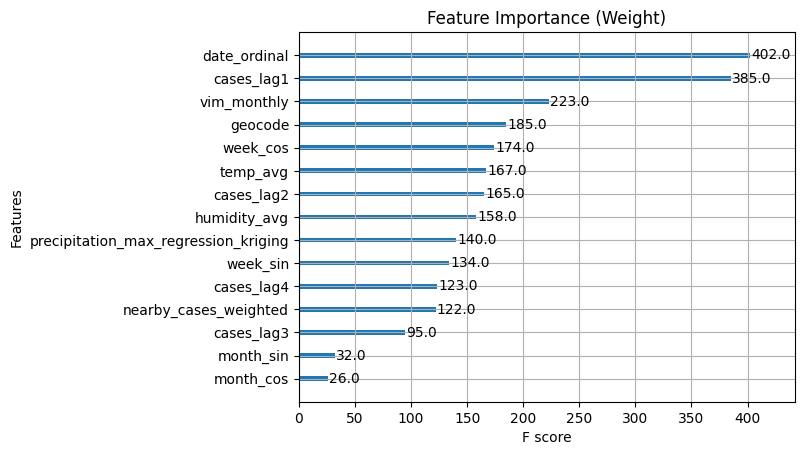

In [36]:
# Feature importance plot
import matplotlib.pyplot as plt

xgb.plot_importance(best_xgb_model, importance_type='weight', title='Feature Importance (Weight)')
plt.show()

In [37]:
# Get unique geocodes
unique_geocodes = X_test['geocode'].unique()

# Print the entire array using numpy
print(np.array2string(unique_geocodes, separator=', '))

[3300100, 3300159, 3300209, 3300225, 3300233, 3300258, 3300308, 3300407,
 3300456, 3300506, 3300605, 3300704, 3300803, 3300902, 3300936, 3300951,
 3301009, 3301108, 3301157, 3301207, 3301306, 3301405, 3301504, 3301603,
 3301702, 3301801, 3301850, 3301876, 3301900, 3302007, 3302056, 3302106,
 3302205, 3302254, 3302270, 3302304, 3302403, 3302452, 3302502, 3302601,
 3302700, 3302809, 3302908, 3303005, 3303104, 3303203, 3303302, 3303401,
 3303500, 3303609, 3303708, 3303807, 3303856, 3303906, 3303955, 3304003,
 3304102, 3304110, 3304128, 3304144, 3304151, 3304201, 3304300, 3304409,
 3304508, 3304524, 3304557, 3304607, 3304706, 3304755, 3304805, 3304904,
 3305000, 3305109, 3305133, 3305158, 3305208, 3305307, 3305406, 3305505,
 3305554, 3305604, 3305703, 3305752, 3305802, 3305901, 3306008, 3306107,
 3306156, 3306206, 3306305]


In [38]:
# Inverse transform the target variable for test data and predictions
y_test_original = target_scaler.inverse_transform(y_test)
y_pred_test_original = target_scaler.inverse_transform(y_pred_test.reshape(-1, 1))

# Inverse transform the target variable for train data and predictions
y_train_original = target_scaler.inverse_transform(y_train)
y_pred_train_original = target_scaler.inverse_transform(y_pred_train.reshape(-1, 1))

# Convert to Pandas Series with correct indices
y_test_original = pd.Series(y_test_original.flatten(), index=X_test.index)
y_pred_test_original = pd.Series(y_pred_test_original.flatten(), index=X_test.index)
y_train_original = pd.Series(y_train_original.flatten(), index=X_train.index)
y_pred_train_original = pd.Series(y_pred_train_original.flatten(), index=X_train.index)

# Evaluate the model using inverse-transformed values
train_mae = mean_absolute_error(y_train_original, y_pred_train_original)
test_mae = mean_absolute_error(y_test_original, y_pred_test_original)

train_rmse = np.sqrt(mean_squared_error(y_train_original, y_pred_train_original))
test_rmse = np.sqrt(mean_squared_error(y_test_original, y_pred_test_original))

train_r2 = r2_score(y_train_original, y_pred_train_original)
test_r2 = r2_score(y_test_original, y_pred_test_original)

# Print evaluation metrics
print("Model Evaluation Metrics (Using Inverse-Transformed Values):")
print(f"Train MAE: {train_mae:.4f}, Test MAE: {test_mae:.4f}")
print(f"Train RMSE: {train_rmse:.4f}, Test RMSE: {test_rmse:.4f}")
print(f"Train R2 Score: {train_r2:.4f}, Test R2 Score: {test_r2:.4f}")

Model Evaluation Metrics (Using Inverse-Transformed Values):
Train MAE: 5.7338, Test MAE: 1.8414
Train RMSE: 23.0160, Test RMSE: 6.3478
Train R2 Score: 0.9901, Test R2 Score: 0.8353


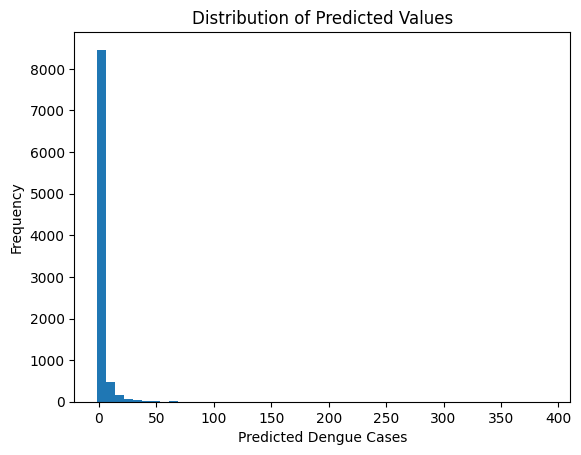

In [39]:
# Check the distribution of predicted values
plt.hist(y_pred_test_original.to_numpy().flatten(), bins=50)
plt.title("Distribution of Predicted Values")
plt.xlabel("Predicted Dengue Cases")
plt.ylabel("Frequency")
plt.show()

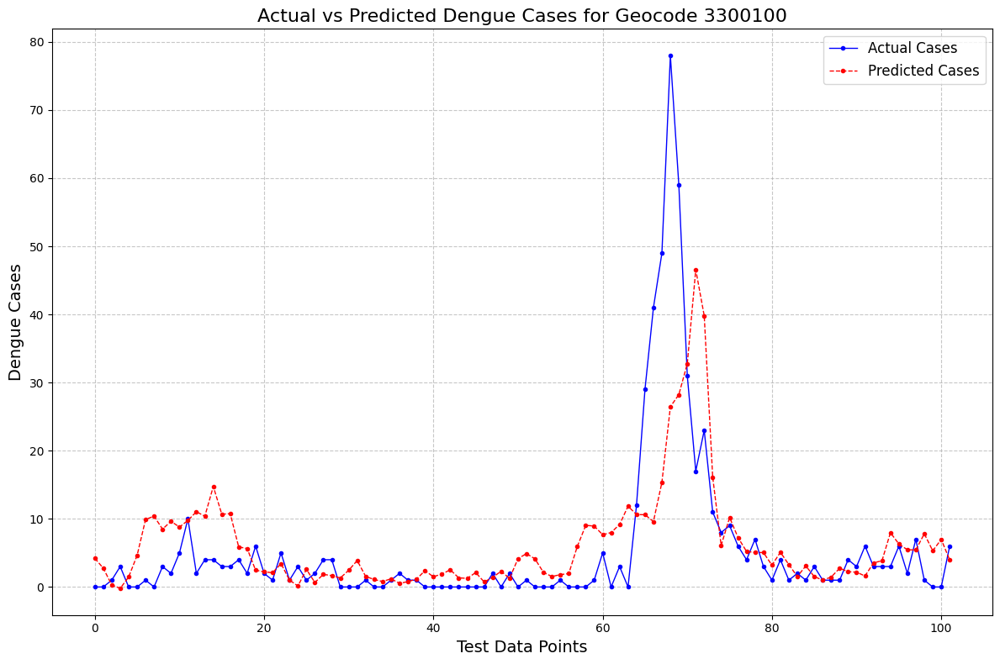

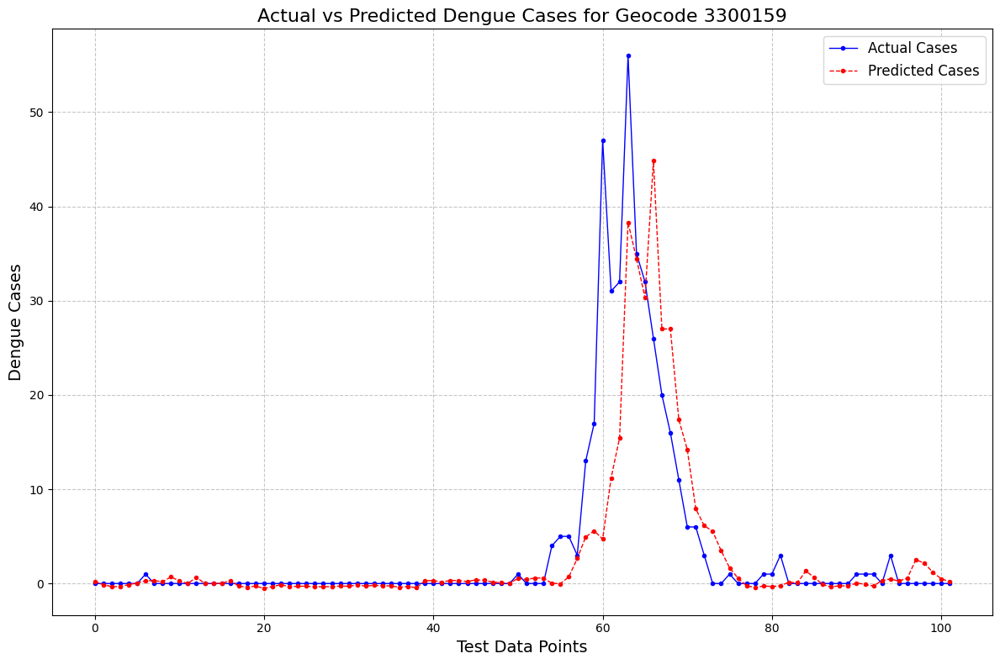

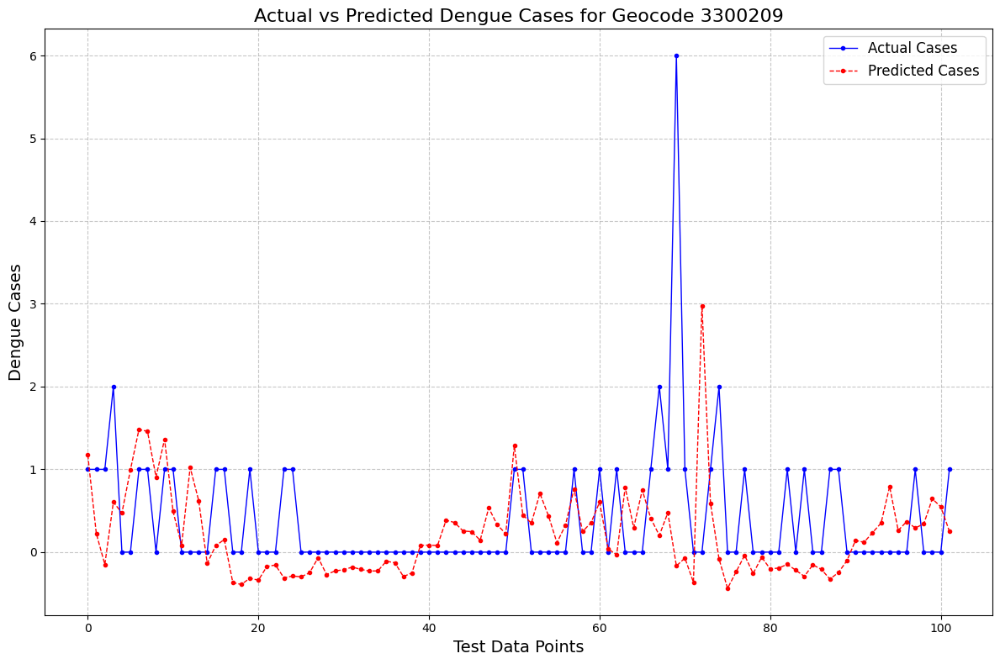

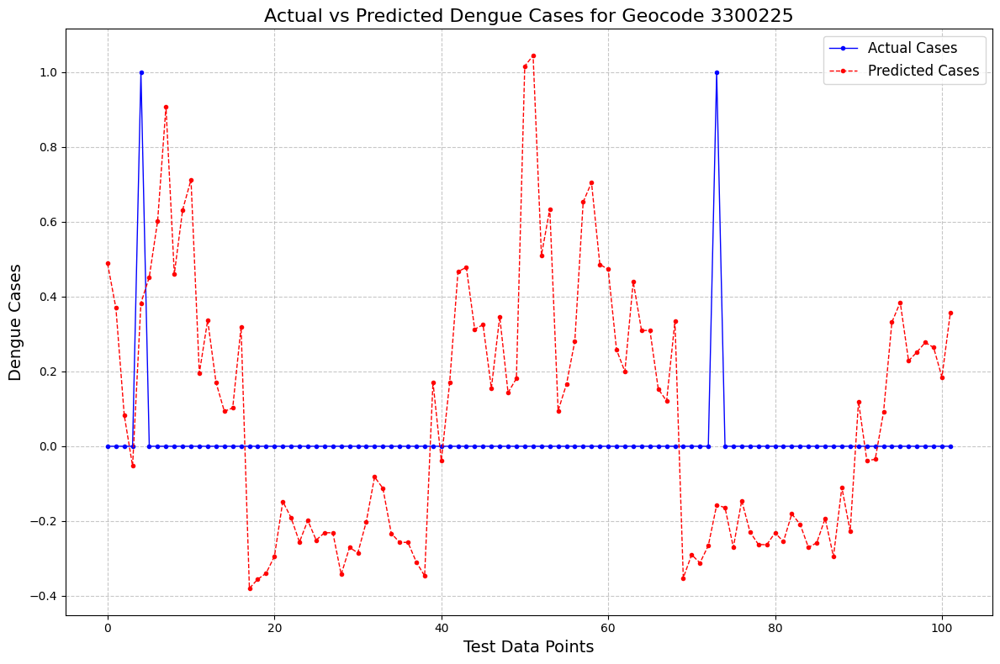

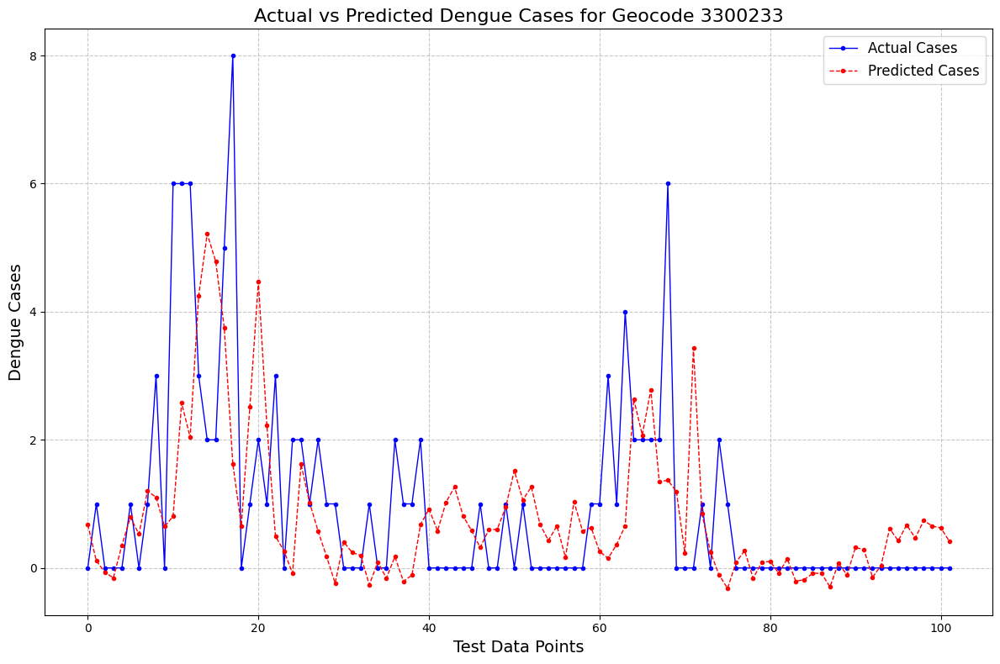

...

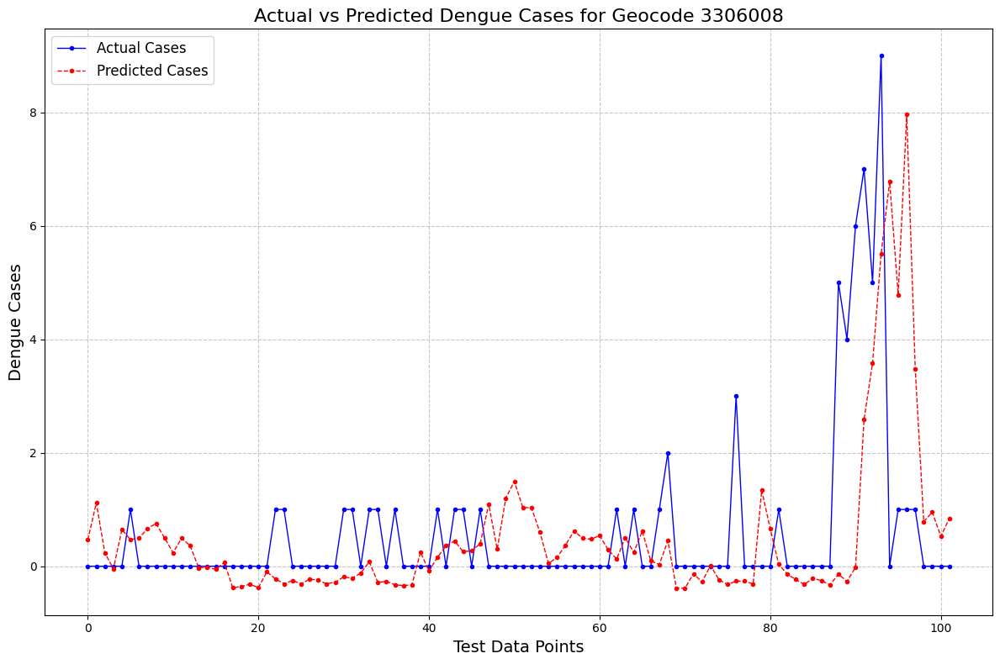

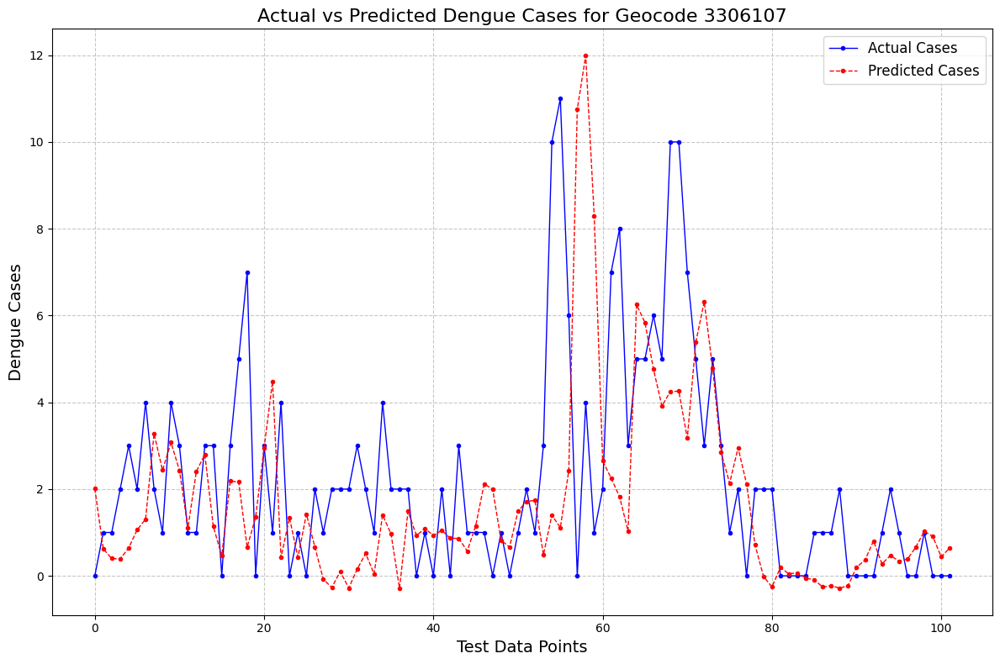

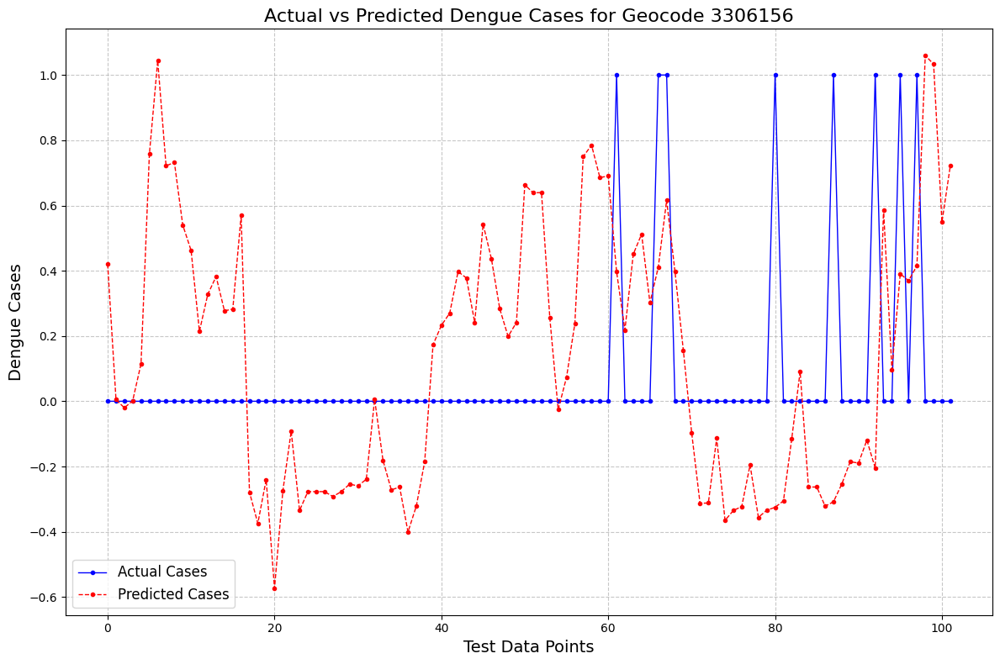

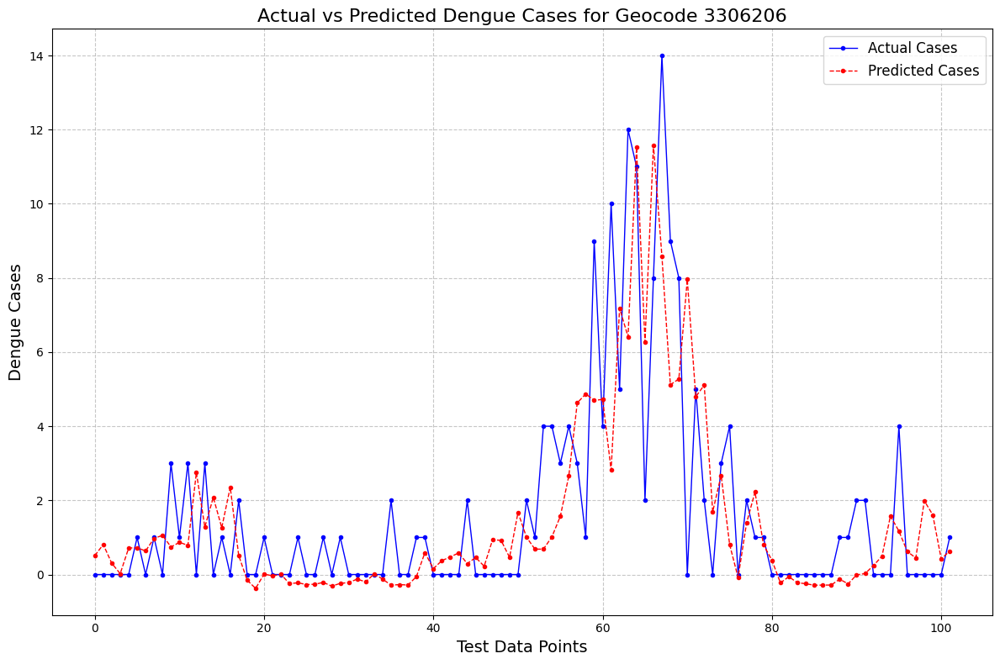

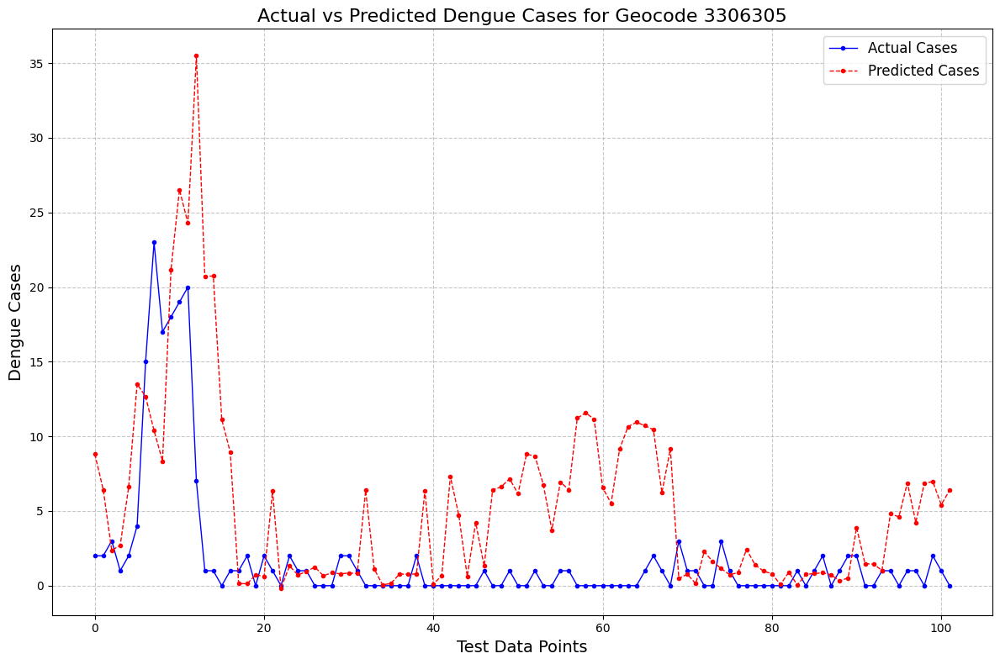

In [40]:
# Loop through all unique geocodes and plot
for geocode_value in unique_geocodes:
    
    # Get indices where the geocode matches
    geocode_indices = X_test[X_test['geocode'] == geocode_value].index
    
    # Filter the transformed data
    y_test_filtered = y_test_original.loc[geocode_indices]
    y_pred_filtered = y_pred_test_original.loc[geocode_indices]
    
    # Create a line plot for actual vs predicted cases
    plt.figure(figsize=(12, 8))
    plt.plot(y_test_filtered.values, label="Actual Cases", marker='.', color='blue', linewidth=1)
    plt.plot(y_pred_filtered.values, label="Predicted Cases", marker='.', color='red', linestyle='--', linewidth=1)
    plt.title(f"Actual vs Predicted Dengue Cases for Geocode {geocode_value}", fontsize=16)
    plt.xlabel("Test Data Points", fontsize=14)
    plt.ylabel("Dengue Cases", fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()